In [6]:
from __future__ import print_function
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [7]:
dataroot = 'data/celeba'
workers = 2
batch_size = 128
image_size = 64
nc = 3
nz = 100
ngf = 64
ndf = 64
num_epochs = 5
lr = 0.0002
beta1 = 0.5
ngpu = 1

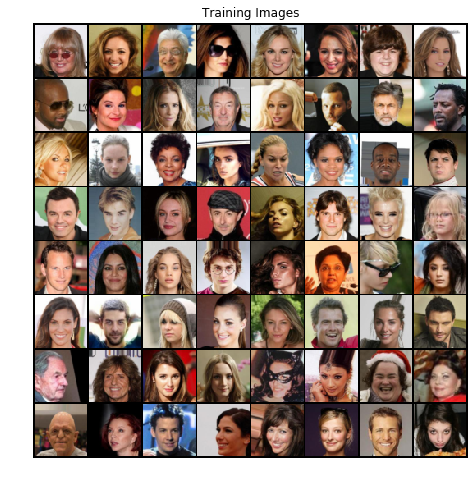

In [8]:
dataset = dset.ImageFolder(root=dataroot, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers = workers)
device = torch.device("cuda: 0" if (torch.cuda.is_available() and ngpu>0) else "cpu")
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [16]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [17]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )
        
    def forward(self, input):
        return self.main(input)

In [18]:
netG = Generator(ngpu).to(device)

if(device.type == 'cuda' and (ngpu>1)):
    netG = nn.DataParallel(netG, list(range(ngpu)))
    
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): ReLU(inplace=True)
    (5): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU(inplace=True)
    (8): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): Tanh()
  )
)


In [20]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, input):
        return self.main(input)

In [21]:
netD = Discriminator(ngpu).to(device)

if(device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
netD.apply(weights_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [22]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)
real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(),lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(),lr=lr, betas=(beta1, 0.999))

In [25]:
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i,data in enumerate(dataloader, 0):
        #1 update D network: maximize log(D(x)) + log(1-D(G(z)))
        #1.1 train with all-real batch
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        #1.2 train with all-fake batch
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
        
        #2 update G network: maximize log(D(G(z)))
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        if i%50 == 0:
            print('[%d/%d] [%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                 % (epoch, num_epochs, i, len(dataloader),
                   errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if(iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/5] [0/1583]	Loss_D: 0.2241	Loss_G: 6.0028	D(x): 0.9976	D(G(z)): 0.1811 / 0.0037
[0/5] [50/1583]	Loss_D: 0.3104	Loss_G: 25.0305	D(x): 0.8599	D(G(z)): 0.0000 / 0.0000
[0/5] [100/1583]	Loss_D: 0.1165	Loss_G: 5.0188	D(x): 0.9353	D(G(z)): 0.0335 / 0.0160
[0/5] [150/1583]	Loss_D: 0.5176	Loss_G: 5.4207	D(x): 0.8920	D(G(z)): 0.2536 / 0.0106
[0/5] [200/1583]	Loss_D: 3.2613	Loss_G: 8.0941	D(x): 0.1103	D(G(z)): 0.0000 / 0.0008
[0/5] [250/1583]	Loss_D: 0.4725	Loss_G: 4.1765	D(x): 0.8426	D(G(z)): 0.1996 / 0.0284
[0/5] [300/1583]	Loss_D: 0.9562	Loss_G: 6.6597	D(x): 0.8888	D(G(z)): 0.5033 / 0.0044
[0/5] [350/1583]	Loss_D: 0.4184	Loss_G: 4.4290	D(x): 0.8019	D(G(z)): 0.1135 / 0.0232
[0/5] [400/1583]	Loss_D: 0.5840	Loss_G: 3.8740	D(x): 0.7584	D(G(z)): 0.1780 / 0.0316
[0/5] [450/1583]	Loss_D: 0.2719	Loss_G: 4.2842	D(x): 0.8425	D(G(z)): 0.0672 / 0.0237
[0/5] [500/1583]	Loss_D: 0.4967	Loss_G: 4.5760	D(x): 0.8104	D(G(z)): 0.1806 / 0.0181
[0/5] [550/1583]	Loss_D: 0.7276	Loss_G: 5

[2/5] [1550/1583]	Loss_D: 0.6881	Loss_G: 3.5576	D(x): 0.8466	D(G(z)): 0.3498 / 0.0446
[3/5] [0/1583]	Loss_D: 1.2185	Loss_G: 4.0365	D(x): 0.8221	D(G(z)): 0.5758 / 0.0287
[3/5] [50/1583]	Loss_D: 0.5979	Loss_G: 2.6486	D(x): 0.8299	D(G(z)): 0.2986 / 0.0912
[3/5] [100/1583]	Loss_D: 0.7766	Loss_G: 1.6796	D(x): 0.5737	D(G(z)): 0.1121 / 0.2519
[3/5] [150/1583]	Loss_D: 0.5308	Loss_G: 2.4900	D(x): 0.8055	D(G(z)): 0.2404 / 0.1126
[3/5] [200/1583]	Loss_D: 0.3511	Loss_G: 3.1631	D(x): 0.8378	D(G(z)): 0.1368 / 0.0576
[3/5] [250/1583]	Loss_D: 0.5161	Loss_G: 2.7341	D(x): 0.8775	D(G(z)): 0.2851 / 0.0849
[3/5] [300/1583]	Loss_D: 0.4955	Loss_G: 2.1315	D(x): 0.7581	D(G(z)): 0.1571 / 0.1526
[3/5] [350/1583]	Loss_D: 0.5109	Loss_G: 3.2374	D(x): 0.8516	D(G(z)): 0.2629 / 0.0540
[3/5] [400/1583]	Loss_D: 1.1030	Loss_G: 1.9975	D(x): 0.4561	D(G(z)): 0.0881 / 0.2084
[3/5] [450/1583]	Loss_D: 0.5660	Loss_G: 2.2736	D(x): 0.7728	D(G(z)): 0.2260 / 0.1306
[3/5] [500/1583]	Loss_D: 0.6463	Loss_G: 3.2873	D(x): 0.8863	D(G(z))

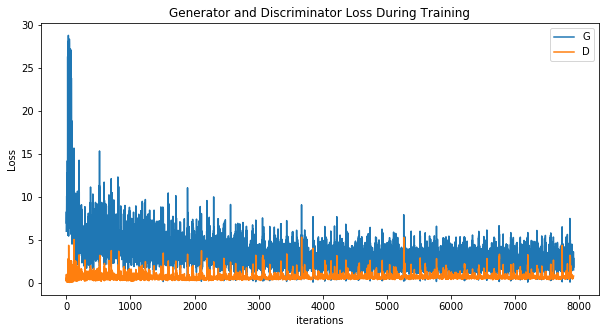

In [26]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

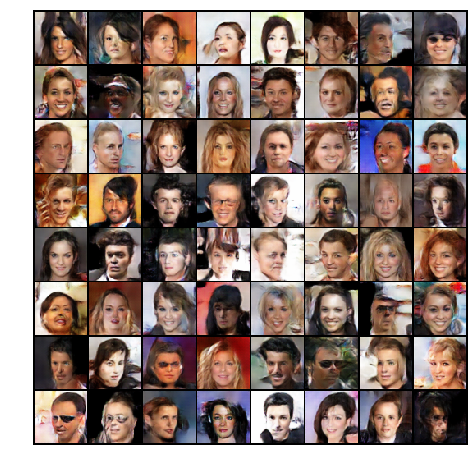

In [27]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1, 2, 0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

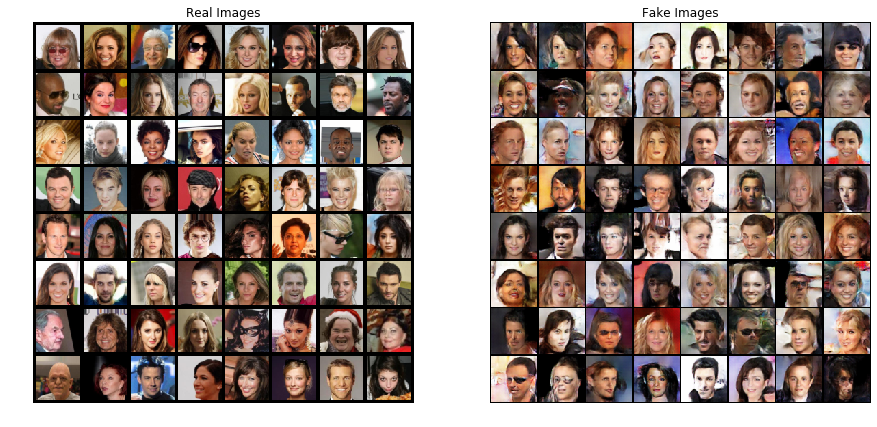

In [28]:
read_batch = next(iter(dataloader))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5,
                                        normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()